In [1]:
import numpy as np
import pandas as pd
import pystan
from scipy.stats import norm, multivariate_normal, invwishart, invgamma
from statsmodels.tsa.stattools import acf
import datetime
import sys
import os

from codebase.plot import * 
from codebase.data import * 
from codebase.file_utils import save_obj, load_obj

import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

%load_ext autoreload
%autoreload 2

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [11]:
dff = pd.read_csv("../dat/clean_sample_iri_flag_data.csv")
# dff.iloc[:,52:]
# dff.iloc[:,2:52]
dff.iloc[:500,:]

,subj_id,subj_flag,6,12,13,16,17,20,23,27,...,110,121,134,136,145,152,159,160,164,169
0,6,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
1,7,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
2,14,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
3,15,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
4,19,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
5,20,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
6,26,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
7,29,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
8,30,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
9,32,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1


In [14]:
flags = np.zeros_like(dff.iloc[:,2:])
flags[500:, 52:] = 1

flags.shape

(541, 70)

In [31]:
log_dir= "log/20191115_003621_irdat_s2_m5/"
# log_dir= "log/20191115_003621_irdat_s2_m4/"
ps = load_obj('ps', log_dir)
data = load_obj('data', log_dir)

In [37]:
mu = np.mean(ps['uu'],0)
mz = np.mean(ps['zz'],0)
mu2 = np.mean(ps['uu']**2,0)

In [18]:
%%opts Layout [fig_size=200]
plots = []
for j in range(data['J']):
        plots.append(plot_trace(ps['beta'][:,j],
             title = 'Posterior distribution for beta(%s)'%(j)).\
                     options(fig_inches=8, aspect=3))
layout = hv.Layout(plots).options(show_title = True,
                                  vspace = .3,
                                  absolute_scaling=False,
                                  normalize=False) # use same y-range for all plots?

layout.cols(2)


:Layout
   .Curve.Posterior_distribution_for_beta_left_parenthesis_0_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_1_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_2_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_3_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_4_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_5_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_6_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_7_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_8_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_9_right_parenthesis  :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_10_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_11_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_12_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_13_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_14_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_15_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_16_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_17_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_18_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_19_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_20_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_21_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_22_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_23_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_24_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_25_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_26_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_27_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_28_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_29_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_30_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_31_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_32_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_33_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_34_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_35_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_36_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_37_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_38_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_beta_left_parenthesis_39_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution

In [33]:
%%opts Layout [fig_size=200]
plots = []
for j in range(10):
        plots.append(plot_trace(ps['zz'][:,j],
             title = 'Posterior distribution for z(%s)'%(j)).\
                     options(fig_inches=8, aspect=3))
layout = hv.Layout(plots).options(show_title = True,
                                  vspace = .3,
                                  absolute_scaling=False,
                                  normalize=False) # use same y-range for all plots?

layout.cols(2)


:Layout
   .Curve.Posterior_distribution_for_z_left_parenthesis_0_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_1_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_2_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_3_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_4_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_5_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_6_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_7_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_8_right_parenthesis :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_z_left_parenthesis_9_right_parenthesis :Curve   [x]   (y)

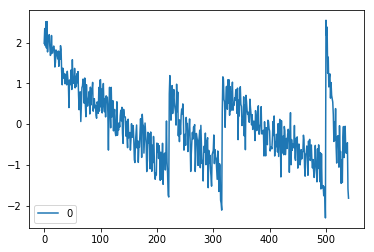

In [34]:
mz= np.mean(ps['zz'],0)
pd.DataFrame(mz).plot()

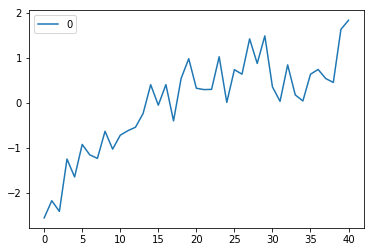

In [20]:
pd.DataFrame(mz[500:]).plot()

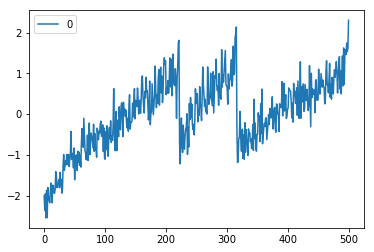

In [21]:
pd.DataFrame(mz[:500]).plot()

In [23]:
compu = np.empty_like(mu)
dim = compu.shape
for i in range(dim[1]):
    compu[:,i] = mz.flatten() + mu[:,i]

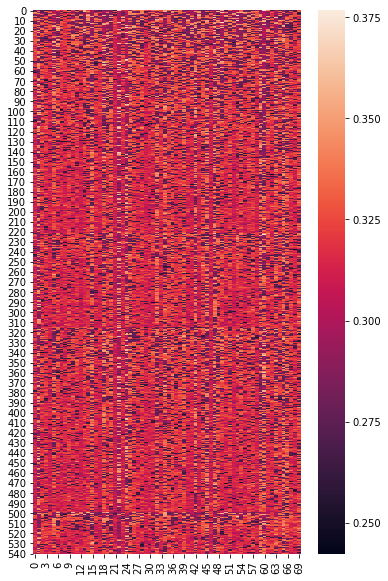

In [38]:
plt.figure(figsize=(6,10))
ax = sns.heatmap(mu, cbar = True )

## Standardized u's

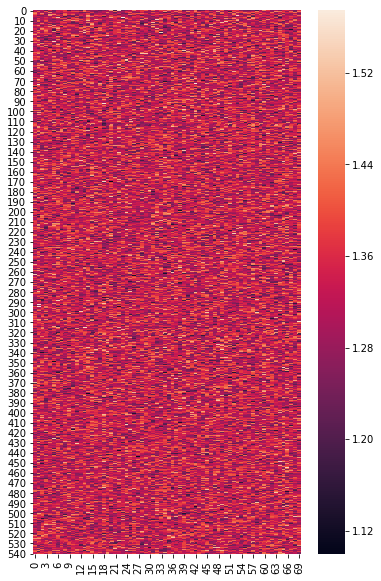

In [40]:
stdu = mu/np.sqrt(mu2 - mu**2)
plt.figure(figsize=(6,10))
ax = sns.heatmap(stdu, cbar = True )

In [42]:
a1 = flags.flatten()
a1.shape

(37870,)

In [43]:
a2 = stdu.flatten()
a2.shape

(37870,)

In [52]:
pct_cutoff = np.percentile(stdu, q=[95])
# a3 = a1[a2>pct_cutoff]
indx = a2>pct_cutoff
a3 = np.zeros_like(a2)
a3[indx]= 1
# a3.sum()

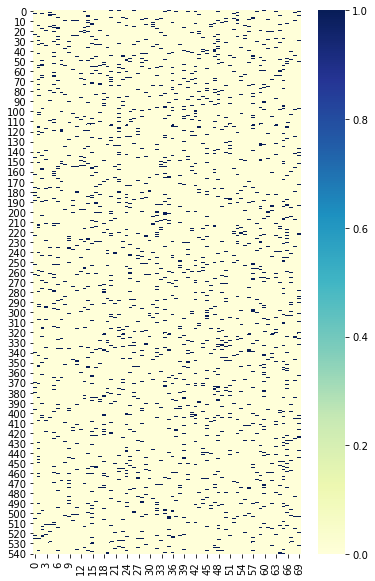

In [53]:
plt.figure(figsize=(6,10))
ax = sns.heatmap(a3.reshape(stdu.shape), cbar = True, cmap="YlGnBu" )

In [134]:
np.mean(flags)

0.0036221385105766443

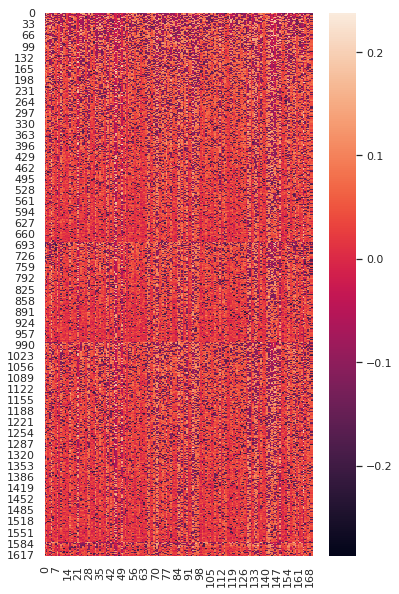

In [140]:
stdu = mu/np.sqrt(mu2 - mu**2)
plt.figure(figsize=(6,10))
ax = sns.heatmap(stdu, cbar = True )

In [143]:
np.mean(stdu[1583:, 108:])*100

1.073361565395652

In [144]:
np.mean(stdu[:1583, :108])*100

0.016966565073725504

In [152]:
pct_cutoff = np.percentile(stdu, q=[60])

In [208]:
pct_cutoff = np.percentile(stdu, q=[50])
pct_cutoff

# plt.figure(figsize=(6,10))
# ax = sns.heatmap(ind_a.reshape(1624, 170), cbar = False, cmap="YlGnBu" )

array([0.02422542])

In [210]:
np.median(stdu)

0.02422542397864043

In [ ]:

a = mu.flatten()
flags = np.zeros_like(a)
ind = np.argpartition(a, -topN)[-topN:]
flags[ind] = 1
# flags_df = flags.reshape(1624, 170)

plt.figure(figsize=(6,10))
ax = sns.heatmap(flags.reshape(1624, 170), cbar = False, cmap="YlGnBu" )

In [125]:
# topN = 100
# ind = np.argpartition(mu, -topN)[-topN:]

# topdf = np.zeros_like(dff)
# mu[ind]

# # plt.figure(figsize=(6,10))
# # ax = sns.heatmap(topdf, cbar = True, cmap="YlGnBu" )

In [48]:
topN = 10
topdf = np.zeros_like(dff)
for i in range(170):
    rowind = dfu[i].nlargest(topN).index
    topdf[rowind, i] = 1
topdf

NameError: name 'dfu' is not defined

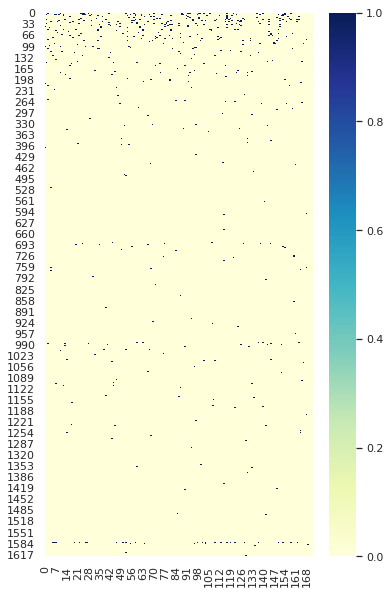

In [96]:
sns.set()
plt.figure(figsize=(6,10))
ax = sns.heatmap(topdf, cbar = True, cmap="YlGnBu" )

In [94]:
# dfu = pd.DataFrame(mu)
# max_subjs = dfu.idxmax() 
# max_subjs[108:]

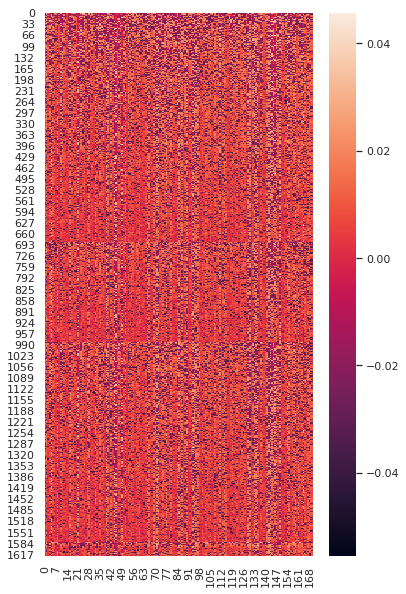

In [69]:
sns.set()
plt.figure(figsize=(6,10))
ax = sns.heatmap(mu, cbar = True )

## Residual Analysis

In [74]:
def get_residuals(mu, mu2, by_axis, absval = True, sort=False):
    """
    params
    ps_u posterior samples of u
    by_axis 0=residuals per iterm, 1=residuals per subject
    """
    mean_u = mu #mean posterior residual matrix
    std_u = np.sqrt(mu2 - mean_u**2) #std of posterior residual matrix
    if absval:
        res = pd.DataFrame(np.sum(np.abs(mean_u/std_u), axis=by_axis)).reset_index()
    else:
        res = pd.DataFrame(np.sum(mean_u/std_u, axis=by_axis)).reset_index()
    res.columns = ['index', 'residual']
    
    if sort:
        res.sort_values('residual', ascending=False, inplace=True)
    return res

get_residuals(mu, mu2, 1, False, True).head()


,index,residual
620,620,2.299078
881,881,2.254899
1579,1579,2.237721
1603,1603,2.235500
322,322,2.158687


In [75]:
# %%opts Bars {+axiswise} [width=1000, height=300, ] 
res = get_residuals(mu, mu2, 1, False, True)

hv.Bars(res[:20], hv.Dimension('index'), 'residual',\
        label='Top 20 Residuals').options(color='blue', xrotation=90).options(fig_inches=8, aspect=3)


:Bars   [index]   (residual)

In [443]:
Z = np.mean(abs(ps['zz']), 0)
mean_flag = np.mean(Z[500:])
mean_flag

0.8965378028330893

In [ ]:
def get_heatmap_data(ps_u):
    """
    params
    ps_u posterior samples of u
    """
    mean_u = np.mean(ps_u, axis=0) #mean posterior residual matrix
    std_u = np.sqrt(np.mean(ps_u**2, axis=0)- mean_u**2) #std of posterior residual matrix
    res = mean_u/std_u
    return res
heatmap_data = get_heatmap_data(ps['uu'])

pd.DataFrame(heatmap_data).to_csv("log/plot_data/lsat_heatmap_data.csv", index=False)

In [444]:
mean_clean = np.mean(Z[:500])
mean_clean

0.7644791216458708

In [369]:
X = np.mean(abs(ps['uu']), 0)
mean_flag = np.mean(X[500:, 50:])
mean_flag

0.15989694101564933

In [370]:
mean_clean = np.mean(X[:500, :50])
mean_clean

0.15956367750994851

In [371]:
X = np.mean(ps['uu'], 0)
mean_flag = np.mean(X[500:, 50:])
np.round(mean_flag, 4)

0.0024

In [372]:
mean_clean = np.mean(X[:500, :50])
np.round(mean_clean, 4)

0.0001

In [376]:
X = np.mean(ps['uu'], 0).flatten().reshape([37870,1])
X.shape

(37870, 1)

In [377]:
y = np.zeros_like(data['D'])
y[500:, 50:] = 1
y = y.flatten()


In [378]:
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(random_state=0,
                         solver='lbfgs',
                         fit_intercept= True,
                        penalty = 'none').fit(X, y)

In [379]:
# clf.score(X,y)
print(clf.coef_, clf.intercept_)

[[8.37533549]] [-3.82064507]


In [380]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

    

In [381]:
pred_probs = clf.predict_proba(X)[:,1]
pred_probs

array([0.01743364, 0.01901743, 0.01963851, ..., 0.02097552, 0.02024871,
       0.01600746])

In [382]:
auc = roc_auc_score(y, pred_probs)
print('AUC: %.2f' % auc)

AUC: 0.54


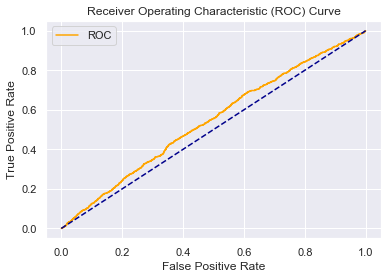

In [383]:
fpr, tpr, thresholds = roc_curve(y, pred_probs)
plot_roc_curve(fpr, tpr)


In [384]:
import statsmodels.api as sm

In [386]:
X = np.mean(ps['uu'], 0).flatten()
X = sm.add_constant(X)
model = sm.Logit(y, X)
result = model.fit()
result.summary()

Optimization terminated successfully.
         Current function value: 0.104194
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                37870
Model:                          Logit   Df Residuals:                    37868
Method:                           MLE   Df Model:                            1
Date:                Fri, 01 Nov 2019   Pseudo R-squ.:                0.002015
Time:                        16:26:47   Log-Likelihood:                -3945.8
converged:                       True   LL-Null:                       -3953.8
Covariance Type:            nonrobust   LLR p-value:                 6.552e-05
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.8206      0.036   -107.146      0.000      -3.891      -3.751
x1             8.3753      2.132      3.929      0.000       4.197      12.553
==============================================================================
"""

In [387]:
result.predict(X)

array([0.01743363, 0.01901743, 0.0196385 , ..., 0.02097551, 0.02024871,
       0.01600745])

In [391]:
a = np.arange(12).reshape([4,3])
a.flatten().reshape([4,3])

array([[ 0,  1,  2],
       [ 3,  4,  5],
       [ 6,  7,  8],
       [ 9, 10, 11]])

In [396]:
predict_proba = result.predict(X).reshape([data['N'], data['J']])
mean_clean = np.mean(predict_proba[:500, :50])
np.round(mean_clean, 4)

0.0217

In [397]:
predict_proba = result.predict(X).reshape([data['N'], data['J']])
mean_clean = np.mean(predict_proba[500:, 50:])
np.round(mean_clean, 4)

0.0221

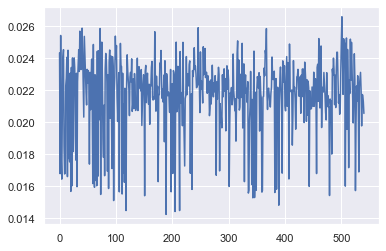

In [405]:
pd.DataFrame(predict_proba).iloc[:,30].plot()

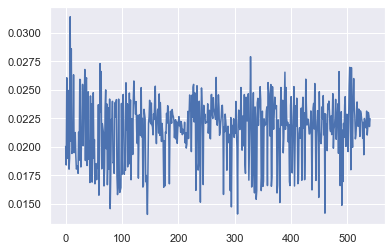

In [406]:
pd.DataFrame(predict_proba).iloc[:,53].plot()

In [408]:
%%opts Layout [fig_size=200]
plots = []
for n in [2,140]:
    for j in range(data['J']):
        plots.append(plot_trace(ps['uu'][:,n,j],
             title = 'Posterior distribution for u(%s,%s)'%(n,j)).\
                     options(fig_inches=8, aspect=3))
layout = hv.Layout(plots).options(show_title = True,
                                  vspace = .3,
                                  absolute_scaling=False,
                                  normalize=False) # use same y-range for all plots?

layout.cols(2)


:Layout
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_0_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_1_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_2_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_3_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_4_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_5_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_6_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_7_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_8_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_9_right_parenthesis    :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_10_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_11_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_12_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_13_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_14_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_15_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_16_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_17_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_18_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_19_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_20_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_21_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_22_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_23_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_24_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_25_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_26_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_27_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_28_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_29_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_30_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_31_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_32_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_33_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_34_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_35_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_36_right_parenthesis   :Curve   [x]   (y)
   .Curve.Posterior_distribution_for_u_left_parenthesis_2_comma_37_rig

In [441]:
def get_heatmap_data(ps_u):
    """
    params
    ps_u posterior samples of u
    """
    mean_u = np.mean(ps_u, axis=0) #mean posterior residual matrix
    std_u = np.sqrt(np.mean(ps_u**2, axis=0)- mean_u**2) #std of posterior residual matrix
    res = mean_u
    return res
heatmap_data = get_heatmap_data(ps['uu'])

# pd.DataFrame(heatmap_data).to_csv("log/plot_data/irdat_heatmap_data.csv", index=False)

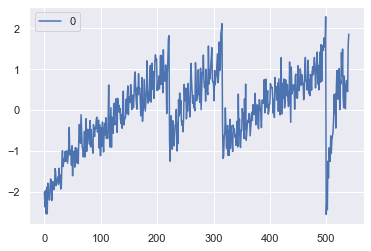

In [442]:
heatmap_data = get_heatmap_data(ps['zz'])
pd.DataFrame(heatmap_data).plot()
# pd.DataFrame(heatmap_data).to_csv("log/plot_data/irdat_heatmap_data.csv", index=False)

In [435]:
import seaborn as sns
import matplotlib.pyplot as plt

In [437]:
sns.set()
plt.figure(figsize=(10,10))
ax = sns.heatmap(heatmap_data[:,], cbar = True )

IndexError: Inconsistent shape between the condition and the input (got (541, 1) and (541,))

<Figure size 720x720 with 0 Axes>

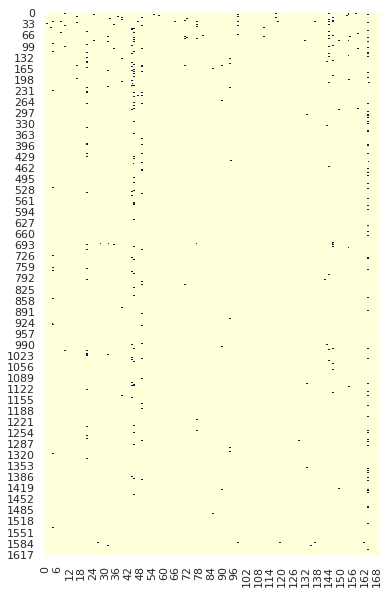

In [133]:
# topN = 1000
# a = mu.flatten()
# flags = np.zeros_like(a)
# ind = np.argpartition(a, -topN)[-topN:]
# flags[ind] = 1
# # flags_df = flags.reshape(1624, 170)

# plt.figure(figsize=(6,10))
# ax = sns.heatmap(flags.reshape(1624, 170), cbar = False, cmap="YlGnBu" )